We discuss the decisions many players will face in PUBG(player unknown's battle ground)

Dataset comes from Kaggle

Dataset URL:www.kaggle.com/skihikingkevin/pubg-match-deaths/version/3

Two datasets are shown in Kaggle:

"aggregate" package shows the data about the players.

"death" package shows the data how the player die in the game.

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [8]:
#To solve the problem to show the symbol "-" normal.
plt.rcParams['axes.unicode_minus'] = False 

In [9]:
#read the csv of aggregate adn show the structure of the form
aggre = pd.read_csv("/Users/zsh/6105Final/Final 6105/pubgDataset/aggregate/agg_match_stats_1.csv")
aggre.head()

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
0,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,2082.823000,0,0,fuckeddup,661.491,100001,50
1,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,1118.815000,0,0,nojiongegg,741.359,100002,47
2,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,25.533026,73,0,Darthmoca,83.255,100006,97
3,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,997.51000,1032.667850,345,3,gk1715,1144.816,100007,30
4,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,4296.35938,2300.323490,449,4,Angeliaboby,1112.843,100021,32


In [10]:
#get the shape of the dataset
aggre.shape

(13844275, 15)

In [11]:
#get name of the columns to explain what was record in the dataset
aggre.columns

Index(['date', 'game_size', 'match_id', 'match_mode', 'party_size',
       'player_assists', 'player_dbno', 'player_dist_ride', 'player_dist_walk',
       'player_dmg', 'player_kills', 'player_name', 'player_survive_time',
       'team_id', 'team_placement'],
      dtype='object')

Now we should explain the meaning of each column:

date: when the game happened

match_id: the player id

match_mode: whether the game was played under the tpp(third person) or the fpp(first person)

party_size: the team statement in the game: maximum players per team

player_assists: Number of assists player did in the game.

player_dbno: Number of the player knocked down others and scored in the game.

player_dist_ride: distance the player in vehicle in the game.

player_dist_walk: distance the player walk in the game.

player_dmg: total Hitpoint the player has dealt.

player_kills: number of kills the player has scored.

player_name: name the player used in the game

player_survive_time: in seconds

team_id: player team id

team_placement: the rank at the end of thegame in the end


In [12]:
#do some cleasing to the data
aggre.drop_duplicates(inplace=True)

In [13]:
aggre.loc[1]

date                                            2017-11-26T01:47:01+0000
game_size                                                             97
match_id               2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...
match_mode                                                           tpp
party_size                                                             1
player_assists                                                         0
player_dbno                                                            0
player_dist_ride                                                       0
player_dist_walk                                                 1118.82
player_dmg                                                             0
player_kills                                                           0
player_name                                                   nojiongegg
player_survive_time                                              741.359
team_id                                            

In [14]:
#the column "won" to distinguish if the player win the game
#aggre["won"] = aggre["team_placement"]==1
aggre.loc[aggre['team_placement'] ==1,'won']=1
aggre.loc[aggre['team_placement'] >1,'won']=0
#"drive" show if the player used the vehicle in the game
aggre["drive"] = aggre["player_dist_ride"]!=0

In [15]:
#column 'drive' is to show if the player used vehicle in game
#if the idstance equals zero or not
aggre.loc[aggre['player_dist_ride'] ==0,'drive']=0
aggre.loc[aggre['player_dist_ride']!=0,'drive']=1

In [16]:
aggre.loc[1]

date                                            2017-11-26T01:47:01+0000
game_size                                                             97
match_id               2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...
match_mode                                                           tpp
party_size                                                             1
player_assists                                                         0
player_dbno                                                            0
player_dist_ride                                                       0
player_dist_walk                                                 1118.82
player_dmg                                                             0
player_kills                                                           0
player_name                                                   nojiongegg
player_survive_time                                              741.359
team_id                                            

First problem we discuss is:

# If kills helps player win the game?

Because in the game, the player has two choices: one is to kill the other is just hide to the end(all the other players died then he wins).

Text(0.5,1,'Relationship Between Kills and Win')

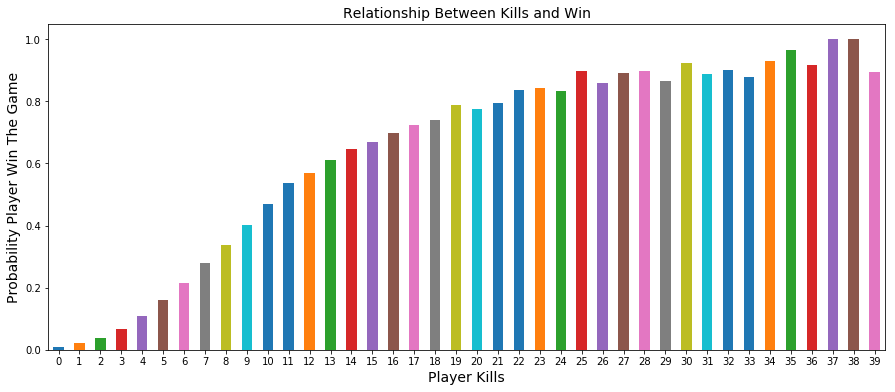

In [17]:
#plot the relationship between kills and win
aggre.loc[aggre["player_kills"] < 40, ["player_kills", "won"]].groupby("player_kills").won.mean().plot.bar(figsize=(15,6), rot=0)
plt.xlabel("Player Kills", fontsize=14)
plt.ylabel("Probability Player Win The Game", fontsize=14)
plt.title("Relationship Between Kills and Win", fontsize=14)

It is obvious that you can hardly win a game just hiding in somewhere.Use 40 because the average is under 40

In [18]:
#the player kills under differnt party size
aggre.groupby("party_size").player_kills.mean()

party_size
1    0.897479
2    0.897744
4    0.876073
Name: player_kills, dtype: float64

It is approximately the same.

/Users/zsh/anaconda3/lib/python3.6/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


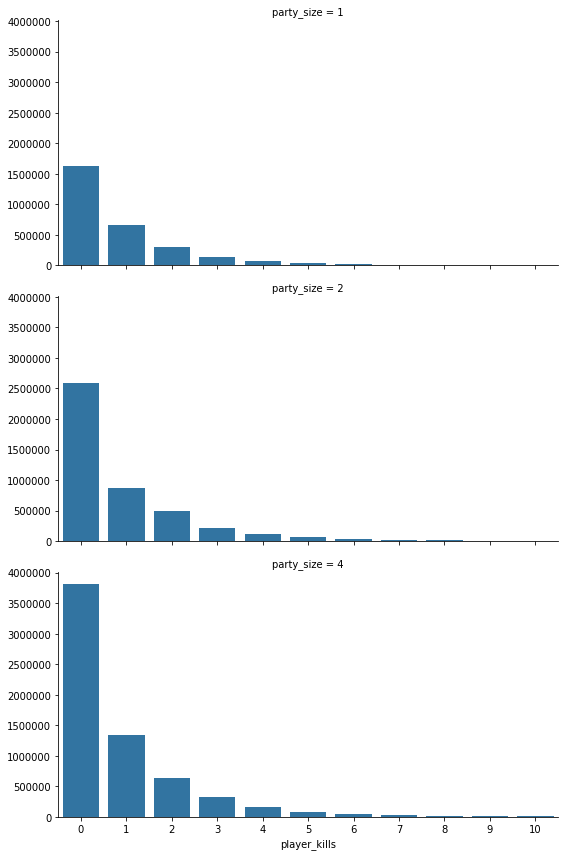

In [19]:
#distribution of number of kill in different 'party size'
g = sns.FacetGrid(aggre.loc[aggre['player_kills']<=10, ['party_size', 'player_kills']], row="party_size", size=4, aspect=2)
g = g.map(sns.countplot, "player_kills")

The second decision:
In the pubg game, you may have teammate.
# Should you help others?

use the "player_assists" and "won" to help you make the decision.

Text(0.5,1,'relationship between win and assists')

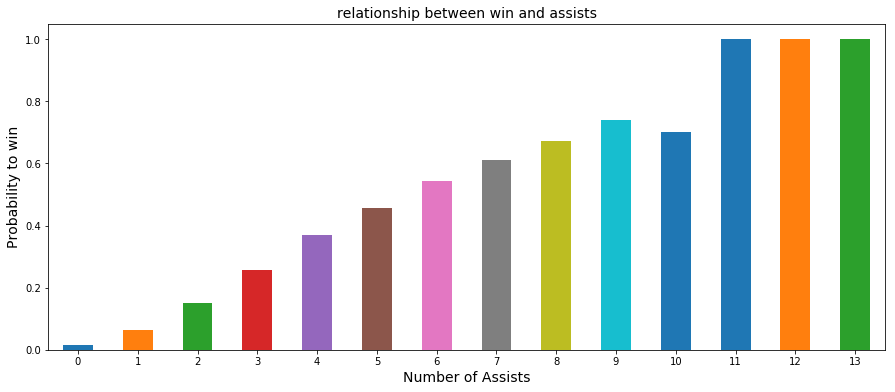

In [20]:
#select the games players are not solo and conbine with "won"
aggre.loc[aggre['party_size']!=1, ['player_assists', 'won']].groupby('player_assists').won.mean().plot.bar(figsize=(15,6), rot=0)
plt.xlabel('Number of Assists', fontsize=14)
plt.ylabel("Probability to win", fontsize=14)
plt.title('relationship between win and assists', fontsize=14)

So it is important to be helpful in the game.

The third decision:

Do you need a vehicle?


([<matplotlib.axis.YTick at 0x1a13c2c748>,
 <a list of 2 Text yticklabel objects>)

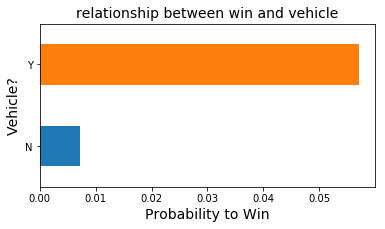

In [21]:
#plot the relationship between win and usage of vehicle
aggre.groupby('drive').won.mean().plot.barh(figsize=(6,3))
plt.xlabel("Probability to Win", fontsize=14)
plt.ylabel("Vehicle?", fontsize=14)
plt.title("relationship between win and vehicle", fontsize=14)
plt.yticks([1,0],['Y','N'])

In [22]:
#plot the distribution of drive distance
distance_drive = aggre.loc[aggre['player_dist_ride']<12000, ['player_dist_ride', 'won']]

In [23]:
dis_label=["0-2k", "2-4k", "4-6k", "6-8k","8-10k", "10-12k"]
distance_drive['drove_cut'] = pd.cut(distance_drive['player_dist_ride'], 6, labels=dis_label)

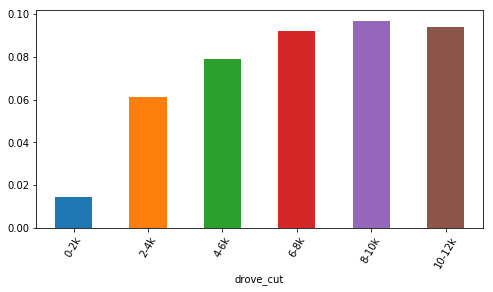

In [24]:
distance_drive.groupby('drove_cut').won.mean().plot.bar(rot=60, figsize=(8,4))

In [25]:
#show solo players(will be used below)
match_unique = aggre.loc[aggre['party_size'] == 1, 'match_id'].unique()
match_unique.shape

(31331,)

The data about kill, use vehicle and the assist all shows : be more active or you will be killed by others or by the radiation. 

Then we come to the kill data,to see the decisions about how to live to the end and how to choose the weapons.

In [26]:
# input the death data and do some cleansing
death1= pd.read_csv('/Users/zsh/6105Final/Final 6105/pubgDataset/deaths/kill_match_stats_final_1.csv')

In [27]:
death1.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,SCAR-L,854545656,1.0,366716.6,302736.6,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1059,SmileyRiley,32.0,366591.3,302851.8
1,AKM,chane_e,57.0,436041.6,276913.3,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,109,bonesaw53,85.0,434867.2,276258.3
2,Hit by Car,LY0629,42.0,265942.7,404094.2,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,624,Robi256,44.0,265409.5,403900.4
3,SKS,Supramida,6.0,339174.6,258929.0,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1450,Senorbotches,14.0,331995.5,253868.1
4,M416,scopionzy,3.0,289848.4,290939.0,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1296,lukesteeler,24.0,290196.1,291358.5


In [28]:
death1.drop_duplicates(inplace=True)

In [29]:
#get infomations of the dataset
death1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13440839 entries, 0 to 13440888
Data columns (total 12 columns):
killed_by            object
killer_name          object
killer_placement     float64
killer_position_x    float64
killer_position_y    float64
map                  object
match_id             object
time                 int64
victim_name          object
victim_placement     float64
victim_position_x    float64
victim_position_y    float64
dtypes: float64(6), int64(1), object(5)
memory usage: 1.3+ GB


In [30]:
death1.shape

(13440839, 12)

Explain meanings of the column:

We only discuss the solo players.

killed_by: killed by which player

killer_name: killer name

killer_placement: the killer rank in the game

killer_position_x

killer_position_y: the position of the killer.

map: there are two maps in this analysis: erangel and miramar

match_id: ID player used in the game

time: alive time in the game

victim_name: the killed player name 

victim_placement: the rank of victim

victim_position_x/victim_position_y:  position of victim

In [31]:
#get the solo players
death1_solo = death1[death1['match_id'].isin(match_unique)]
death1_solo.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,SCAR-L,854545656,1.0,366716.6,302736.6,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1059,SmileyRiley,32.0,366591.3,302851.8
1,AKM,chane_e,57.0,436041.6,276913.3,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,109,bonesaw53,85.0,434867.2,276258.3
2,Hit by Car,LY0629,42.0,265942.7,404094.2,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,624,Robi256,44.0,265409.5,403900.4
3,SKS,Supramida,6.0,339174.6,258929.0,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1450,Senorbotches,14.0,331995.5,253868.1
4,M416,scopionzy,3.0,289848.4,290939.0,MIRAMAR,2U4GBNA0YmmZtkItUaRt5bERD2XnqEiYq0Lv_ysjwIZsUH...,1296,lukesteeler,24.0,290196.1,291358.5


first problem in this dataset is that :

# Which place is safe in the map to land？

In [32]:
#get the player information that players dead in 180 seconds
death_180_seconds_erg = death1_solo.loc[(death1_solo['map'] == 'ERANGEL')&(death1_solo['time'] < 180)&(death1_solo['victim_position_x']>0), :].dropna()
death_180_seconds_mrm = death1_solo.loc[(death1_solo['map'] == 'MIRAMAR')&(death1_solo['time'] < 180)&(death1_solo['victim_position_x']>0), :].dropna()

In [33]:
death_180_seconds_erg.shape

(463135, 12)

In [34]:
death_180_seconds_mrm.shape

(94057, 12)

In [35]:
#get the position of dead persons
data_erg = death_180_seconds_erg[['victim_position_x', 'victim_position_y']].values
data_mrm = death_180_seconds_mrm[['victim_position_x', 'victim_position_y']].values

In [36]:
#scale the map again
data_erg = data_erg*4096/800000
data_mrm = data_mrm*1000/800000

In [37]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from scipy.misc.pilutil import imread

In [38]:
#define a function to show position the player died

def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

In [39]:
#insert the maps

bge = imread('/Users/zsh/6105Final/Final 6105/pubgDataset/erangel.jpg')
bgm = imread('/Users/zsh/6105Final/Final 6105/pubgDataset/miramar.jpg')

/Users/zsh/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/zsh/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


In [40]:
#set the attributes to paint on the map
hmap, extent = heatmap(data_erg[:,0], data_erg[:,1], 4.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*4.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

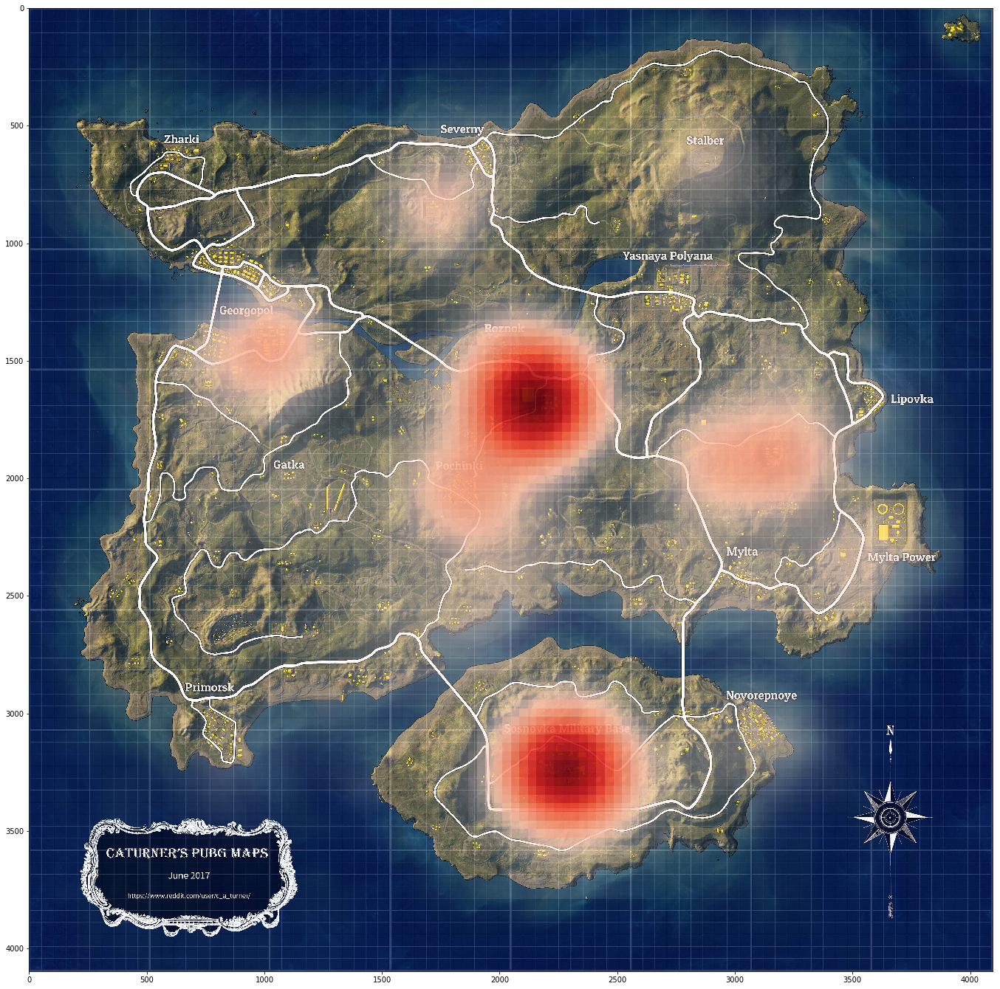

In [41]:
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bge)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()

In [42]:
#same to the other map
hmap, extent = heatmap(data_mrm[:,0], data_mrm[:,1], 4)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*4, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

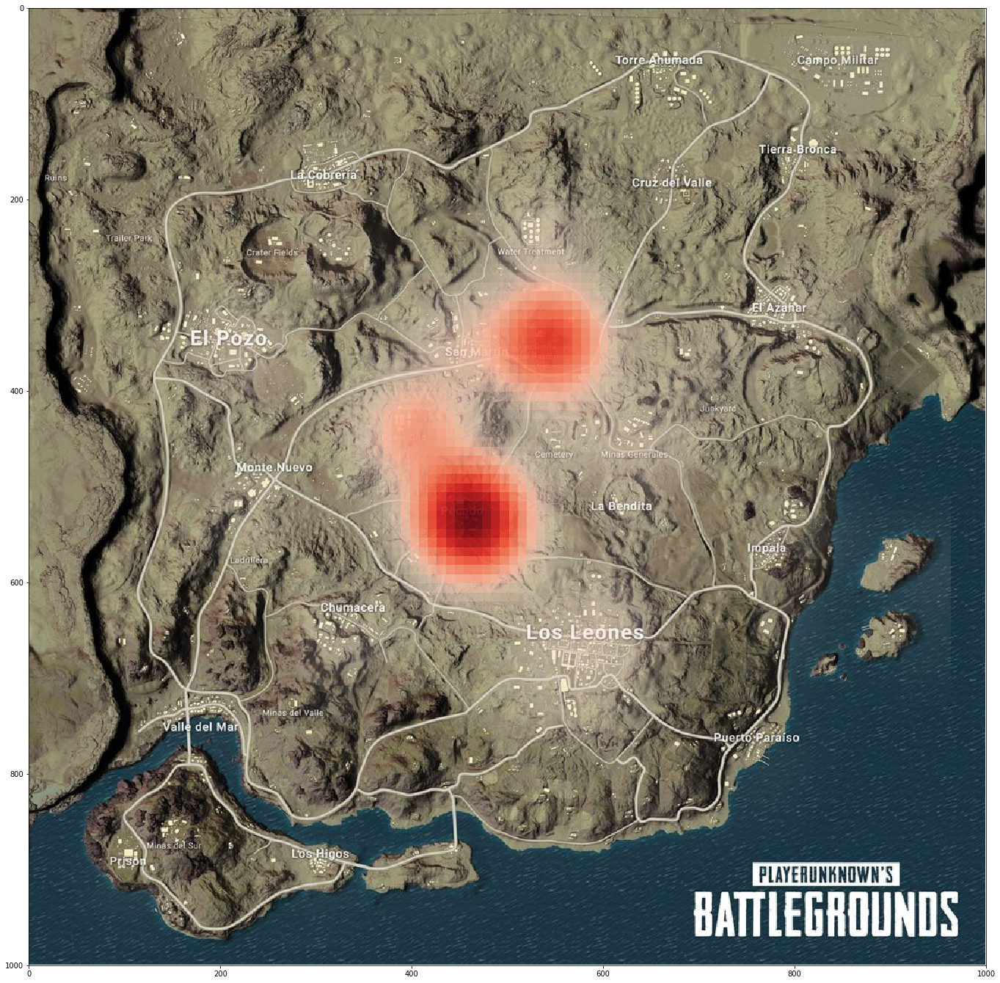

In [43]:
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 1000); ax.set_ylim(0, 1000)
ax.imshow(bgm)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
#plt.scatter(plot_data_mr[:,0], plot_data_mr[:,1])
plt.gca().invert_yaxis()

# Where will be the final circle?

(final circle is the safe location without radiation in the end)

We can get the positon of the final circle by getting the position of the players who ranks the first and the second. their position in the end must be the final circle.

In [44]:
#get death infomation of player ranks second will show the positon of winner at the same time
#because his death must relate to the position of final circle
death_final_circle_erg = death1_solo.loc[(death1_solo['map'] == 'ERANGEL')&(death1_solo['victim_placement'] == 2)&(death1_solo['victim_position_x']>0)&(death1_solo['killer_position_x']>0), :].dropna()
death_final_circle_mrm = death1_solo.loc[(death1_solo['map'] == 'MIRAMAR')&(death1_solo['victim_placement'] == 2)&(death1_solo['victim_position_x']>0)&(death1_solo['killer_position_x']>0), :].dropna()

In [45]:
final_circle_erg = np.vstack([death_final_circle_erg[['victim_position_x', 'victim_position_y']].values, 
                                    death_final_circle_erg[['killer_position_x', 'killer_position_y']].values])*4096/800000
final_circle_mrm = np.vstack([death_final_circle_mrm[['victim_position_x', 'victim_position_y']].values,
                                    death_final_circle_mrm[['killer_position_x', 'killer_position_y']].values])*1000/800000

In [46]:
death_final_circle_erg.shape

(23793, 12)

In [47]:
death_final_circle_mrm.shape

(4666, 12)

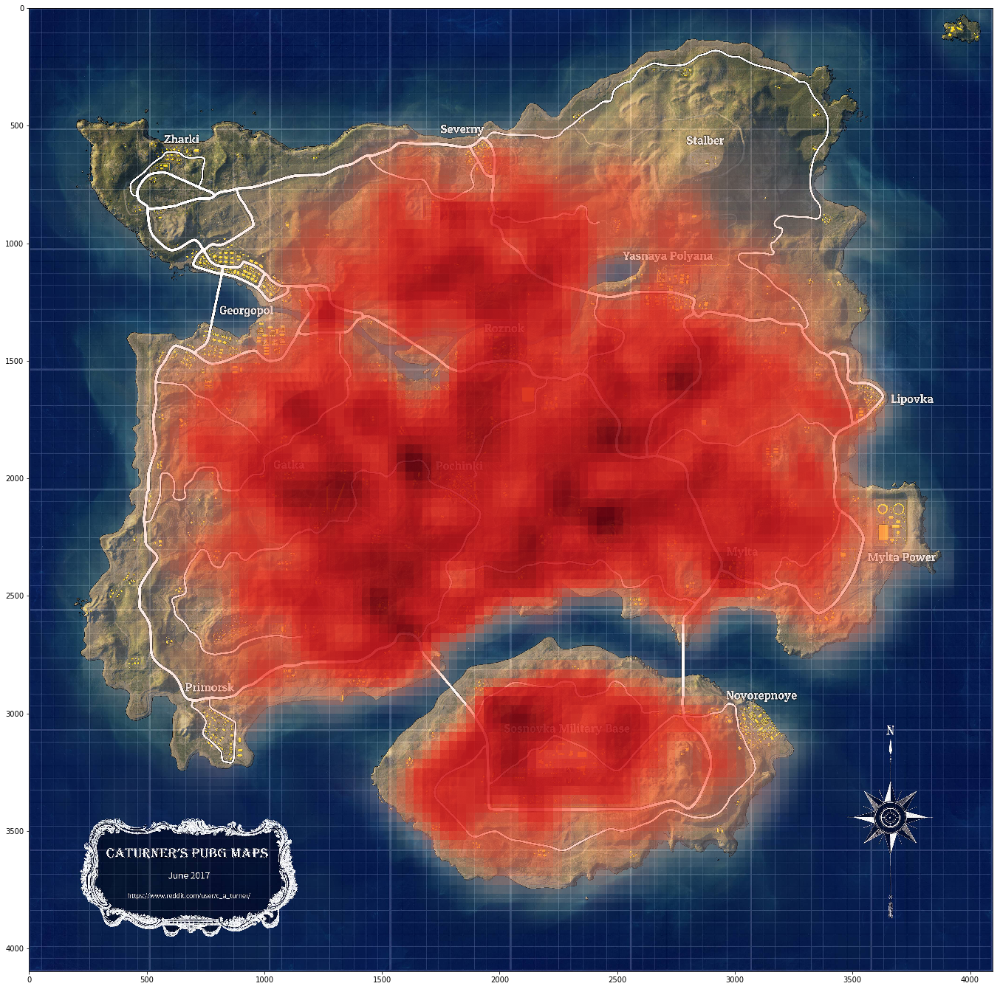

In [48]:
#print the position on the maps
hmap, extent = heatmap(final_circle_erg[:,0], final_circle_erg[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bge)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()

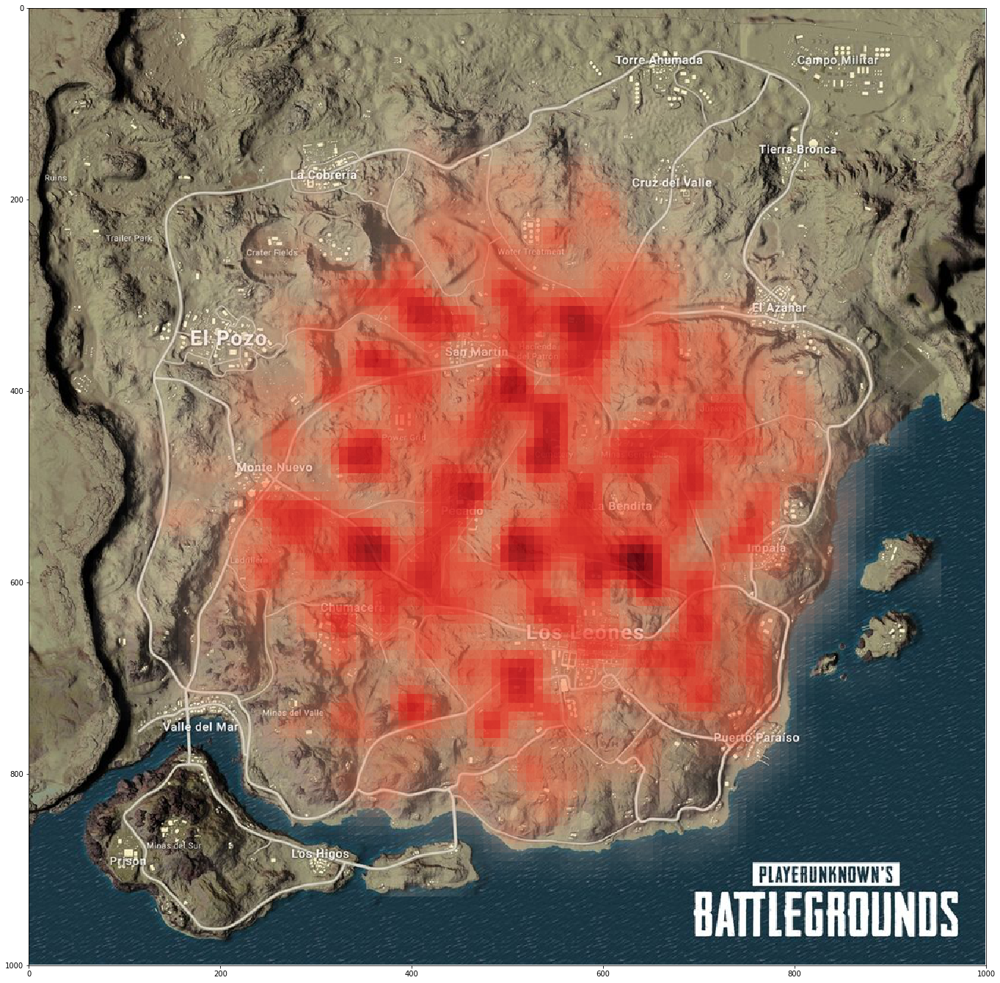

In [49]:

hmap, extent = heatmap(final_circle_mrm[:,0], final_circle_mrm[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 1000); ax.set_ylim(0, 1000)
ax.imshow(bgm)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()

See the red area we can draw the conclusion that the final circle is random...... So believe in your luck.

# Which weapon is most useful in the game?
 We analysed the weapons made the most death in the games.

we choose the resultful data by two conditions: the first is the player is not died at the beginning, because this death does not because of the weapon, second the death should happen inside the map. these two condition ensure the player died from the weapon

In [50]:
# get death infomation of players not died at the beginning and died on the map(get resultful death data)
erg_died_of = death1.loc[(death1['map']=='ERANGEL')&(death1['killer_position_x']>0)&(death1['victim_position_x']>0)&(death1['killed_by']!='Down and Out'),:]
mrm_died_of = death1.loc[(death1['map']=='MIRAMAR')&(death1['killer_position_x']>0)&(death1['victim_position_x']>0)&(death1['killed_by']!='Down and Out'),:]

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text yticklabel objects>)

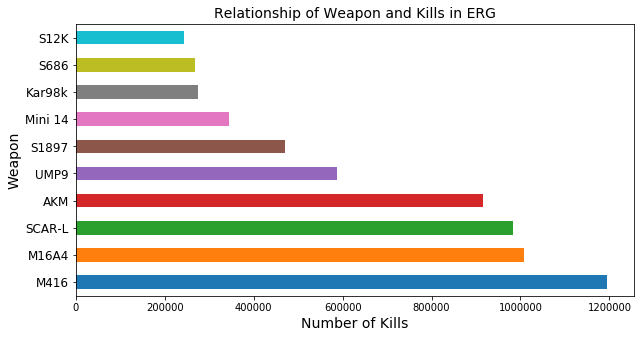

In [51]:
#plot the informations in the two maps
erg_died_of['killed_by'].value_counts()[:10].plot.barh(figsize=(10,5))
plt.xlabel("Number of Kills", fontsize=14)
plt.ylabel("Weapon", fontsize=14)
plt.title('Relationship of Weapon and Kills in ERG', fontsize=14)
plt.yticks(fontsize=12)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text yticklabel objects>)

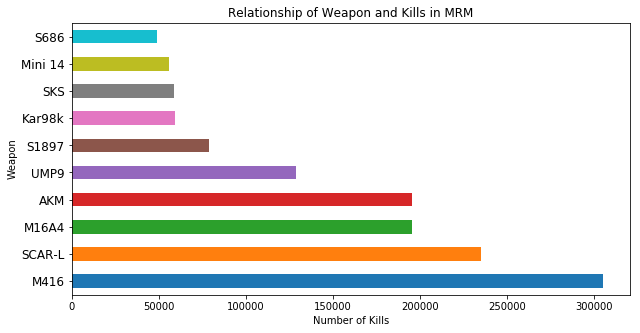

In [52]:
mrm_died_of['killed_by'].value_counts()[:10].plot.barh(figsize=(10,5))
plt.xlabel("Number of Kills")
plt.ylabel("Weapon")
plt.title('Relationship of Weapon and Kills in MRM')
plt.yticks(fontsize=12)

Many players are willing to hide and sniper in the game, because it is a little safer and can enjoy the happiness from design a small conspiracy

But they should get the right weapon to make sure their sniper is efficient.

# Which weapon is useful in sniper?

In [53]:
#We have the position data but we should change them into the distance(change the pixel to meter)
#in two different maps
erg_distance = np.sqrt(((erg_died_of['killer_position_x']-erg_died_of['victim_position_x'])/100)**2 + ((erg_died_of['killer_position_y']-erg_died_of['victim_position_y'])/100)**2)
mrm_distance = np.sqrt(((mrm_died_of['killer_position_x']-mrm_died_of['victim_position_x'])/100)**2 + ((mrm_died_of['killer_position_y']-mrm_died_of['victim_position_y'])/100)**2)

/Users/zsh/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


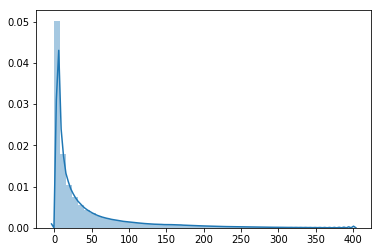

In [54]:
sns.distplot(erg_distance.loc[erg_distance<400])

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800., 900.]),
 <a list of 10 Text yticklabel objects>)

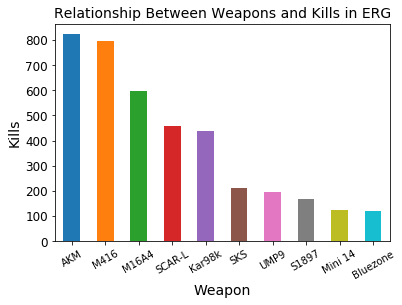

In [55]:
# get death happened in the sniper range
erg_died_of.loc[(erg_distance > 800)&(erg_distance < 1500), 'killed_by'].value_counts()[:10].plot.bar(rot=30)
plt.xlabel("Weapon", fontsize=14)
plt.ylabel("Kills", fontsize=14)
plt.title('Relationship Between Weapons and Kills in ERG', fontsize=14)
plt.yticks(fontsize=12)

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 <a list of 9 Text yticklabel objects>)

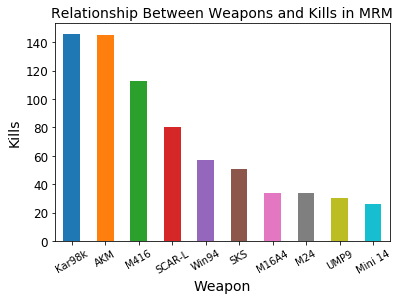

In [56]:
mrm_died_of.loc[(mrm_distance > 800)&(mrm_distance < 1000), 'killed_by'].value_counts()[:10].plot.bar(rot=30)
plt.xlabel("Weapon", fontsize=14)
plt.ylabel("Kills", fontsize=14)
plt.title('Relationship Between Weapons and Kills in MRM', fontsize=14)
plt.yticks(fontsize=12)

# Which weapon is most useful in melee?

(array([     0.,  50000., 100000., 150000., 200000., 250000., 300000.,
        350000., 400000., 450000.]), <a list of 10 Text yticklabel objects>)

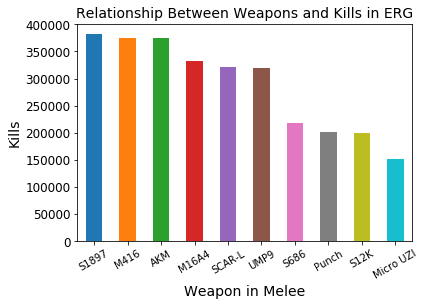

In [57]:
#show the player who was killed in 10 meters and get the weapon
erg_died_of.loc[erg_distance<10, 'killed_by'].value_counts()[:10].plot.bar(rot=30)
plt.xlabel("Weapon in Melee", fontsize=14)
plt.ylabel("Kills", fontsize=14)
plt.title('Relationship Between Weapons and Kills in ERG', fontsize=14)
plt.yticks(fontsize=12)

(array([     0.,  20000.,  40000.,  60000.,  80000., 100000., 120000.]),
 <a list of 7 Text yticklabel objects>)

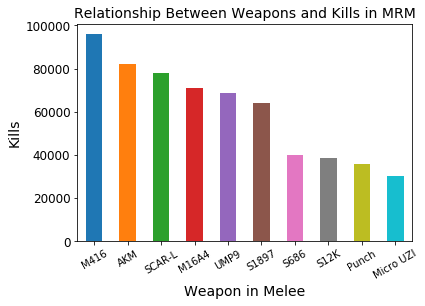

In [58]:
mrm_died_of.loc[mrm_distance<10, 'killed_by'].value_counts()[:10].plot.bar(rot=30)
plt.xlabel("Weapon in Melee", fontsize=14)
plt.ylabel("Kills", fontsize=14)
plt.title('Relationship Between Weapons and Kills in MRM', fontsize=14)
plt.yticks(fontsize=12)

# Top 10 weapon are most efficient in which distance

In [59]:
#get informations person died in 800 meters and get top 10 most efficient weapon in this distance
erg_died_of['erg_dist'] = erg_distance
erg_died_of = erg_died_of.loc[erg_died_of['erg_dist']<800, :]
top_weapons_erg = list(erg_died_of['killed_by'].value_counts()[:10].index)
top_weapon_kills = erg_died_of[np.in1d(erg_died_of['killed_by'], top_weapons_erg)].copy()
top_weapon_kills['bin'] = pd.cut(top_weapon_kills['erg_dist'], np.arange(0, 800, 10), include_lowest=True, labels=False)
top_weapon_kills_wide = top_weapon_kills.groupby(['killed_by', 'bin']).size().unstack(fill_value=0).transpose()

/Users/zsh/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Top 10 weapon are measured by the number of death happens under the weapon.

In [60]:
top_weapon_kills = erg_died_of[np.in1d(erg_died_of['killed_by'], top_weapons_erg)].copy()
top_weapon_kills['bin'] = pd.cut(top_weapon_kills['erg_dist'], np.arange(0, 800, 10), include_lowest=True, labels=False)
top_weapon_kills_wide = top_weapon_kills.groupby(['killed_by', 'bin']).size().unstack(fill_value=0).transpose()

In [61]:
top_weapon_kills_wide = top_weapon_kills_wide.div(top_weapon_kills_wide.sum(axis=1), axis=0)

In [62]:
#import the tool: 'bokeh' to show the relationship directly
#we only plot the data in map erangel

from bokeh.models.tools import HoverTool
from bokeh.palettes import brewer
from bokeh.plotting import figure, show, output_notebook
from bokeh.models.sources import ColumnDataSource

In [63]:
def  stacked(df):
    df_top = df.cumsum(axis=1)
    df_bottom = df_top.shift(axis=1).fillna(0)[::-1]
    df_stack = pd.concat([df_bottom, df_top], ignore_index=True)
    return df_stack

hover = HoverTool(
    tooltips=[
            ("index", "$index"),
            ("weapon", "@weapon"),
            ("(x,y)", "($x, $y)")
        ],
    point_policy='follow_mouse'
    )

areas = stacked(top_weapon_kills_wide)

colors = brewer['Spectral'][areas.shape[1]]
x2 = np.hstack((top_weapon_kills_wide.index[::-1],
                top_weapon_kills_wide.index)) /0.095

TOOLS="pan,wheel_zoom,box_zoom,reset,previewsave"
output_notebook()
p = figure(x_range=(1, 800), y_range=(0, 1), tools=[TOOLS, hover], plot_width=800)
p.grid.minor_grid_line_color = '#eeeeee'

source = ColumnDataSource(data={
    'x': [x2] * areas.shape[1],
    'y': [areas[c].values for c in areas],
    'weapon': list(top_weapon_kills_wide.columns),
    'color': colors
})

p.patches('x', 'y', source=source, legend="weapon",
          color='color', alpha=0.8, line_color=None)
p.title.text = "Percentage Top10 Weapon Kills in Different Distance in ERG"
p.xaxis.axis_label = "Kill Distance"
p.yaxis.axis_label = "Percentage"

show(p)

Loading BokehJS ...

Train the model to foresee if a player will win the game. So we should do some cleansing and classify.

In [64]:
aggre.dropna(axis = 0,how ='any',inplace=True)

In [65]:
aggre.head()

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement,won,drive
0,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,2082.823000,0,0,fuckeddup,661.491,100001,50,0.0,0
1,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,1118.815000,0,0,nojiongegg,741.359,100002,47,0.0,0
2,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,0.00000,25.533026,73,0,Darthmoca,83.255,100006,97,0.0,0
3,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,997.51000,1032.667850,345,3,gk1715,1144.816,100007,30,0.0,1
4,2017-11-26T01:47:01+0000,97,2U4GBNA0Yml_MDIpsXDjMltu0-r8UqS8skCECcelwiP7iu...,tpp,1,0,0,4296.35938,2300.323490,449,4,Angeliaboby,1112.843,100021,32,0.0,1


In [66]:
#the original data is too complex to do the decision tree
#map the kills and distance of ride 
#use the rank intead of the real data
aggre.loc[aggre['player_kills'] >=10,'kill_rank']=1
aggre.loc[(aggre['player_kills']<=9)&(aggre['player_kills']>=7),'kill_rank']=2
aggre.loc[(aggre['player_kills']<=6)&(aggre['player_kills']>=3),'kill_rank']=3
aggre.loc[aggre['player_kills'] <=2,'kill_rank']=4

In [68]:
aggre.groupby('kill_rank').size()

kill_rank
1.0       47587
2.0      119474
3.0     1325459
4.0    12331689
dtype: int64

(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]),
 <a list of 8 Text yticklabel objects>)

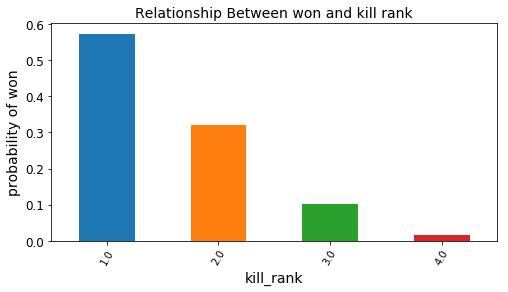

In [69]:
aggre.groupby('kill_rank').won.mean().plot.bar(rot=60, figsize=(8,4))
plt.xlabel("kill_rank", fontsize=14)
plt.ylabel("probability of won", fontsize=14)
plt.title('Relationship Between won and kill rank', fontsize=14)
plt.yticks(fontsize=12)

In [70]:
aggre.loc[(aggre['player_dist_ride'] <=2000), 'player_dist_ride'] = 0
aggre.loc[(aggre['player_dist_ride'] > 2000) & (aggre['player_dist_ride'] <= 4000), 'player_dist_ride'] = 1
aggre.loc[(aggre['player_dist_ride'] > 4000) & (aggre['player_dist_ride'] <= 6000), 'player_dist_ride'] = 2
aggre.loc[(aggre['player_dist_ride'] > 6000) & (aggre['player_dist_ride'] <= 8000), 'player_dist_ride'] = 3
aggre.loc[(aggre['player_dist_ride'] > 8000) & (aggre['player_dist_ride'] <= 10000), 'player_dist_ride'] = 4
aggre.loc[(aggre['player_dist_ride'] > 10000) & (aggre['player_dist_ride'] <= 12000), 'player_dist_ride'] = 5

In [71]:
#get the principle to divide the survive time

aggre['player_survive_time'].mean()

786.4278357814125

In [72]:
aggre['player_survive_time'].quantile(0.25)

246.952

In [73]:
aggre['player_survive_time'].quantile(0.75)

1299.9489999999996

In [74]:
aggre['player_survive_time'].max()

2362.996

In [75]:
aggre['player_survive_time'].min()

31.312

In [76]:
#map the survivetime
aggre.loc[(aggre['player_survive_time'] <=247), 'player_survive_time'] = 0
aggre.loc[(aggre['player_survive_time'] > 247) & (aggre['player_survive_time'] <= 786), 'player_survive_time'] = 1
aggre.loc[(aggre['player_survive_time'] > 786) & (aggre['player_survive_time'] <= 1299), 'player_survive_time'] = 2
aggre.loc[(aggre['player_survive_time'] > 1299), 'player_survive_time'] = 3

In [77]:
#drop the data has no relationship with the player'sbehavior or the relationship was shown by the other one
aggre_t = aggre.drop(['player_kills','date', 'match_id','player_dbno','player_dist_walk','player_dmg','team_placement','game_size', 'player_name','team_id','match_mode'], axis=1)
aggre_t.head()

,party_size,player_assists,player_dist_ride,player_survive_time,won,drive,kill_rank
0,1,0,0.0,1.0,0.0,0,4.0
1,1,0,0.0,1.0,0.0,0,4.0
2,1,0,0.0,0.0,0.0,0,4.0
3,1,0,0.0,2.0,0.0,1,3.0
4,1,0,2.0,2.0,0.0,1,3.0


In [78]:
#map the statement if the player won the game
aggre_t.loc[(aggre_t['won'] ==0), 'Won'] = "w"
aggre_t.loc[(aggre_t['won'] ==1), 'Won'] = "f"
aggre_t = aggre_t.drop(['won'], axis=1)
aggre_t.head()

,party_size,player_assists,player_dist_ride,player_survive_time,drive,kill_rank,Won
0,1,0,0.0,1.0,0,4.0,w
1,1,0,0.0,1.0,0,4.0,w
2,1,0,0.0,0.0,0,4.0,w
3,1,0,0.0,2.0,1,3.0,w
4,1,0,2.0,2.0,1,3.0,w


In [79]:
#rename the attributes we will use in the decision tree
attribute_names = ['part_size', 
                   'assists', 
                   'ride_distance', 
                   'suvive_time', 
                   'drive_or_not', 
                   'kill_rank',
                  'class']
print(attribute_names)

['part_size', 'assists', 'ride_distance', 'suvive_time', 'drive_or_not', 'kill_rank', 'class']


In [80]:
#import the necessary packages

import numpy as np 
import pandas as pd 
from sklearn.metrics import confusion_matrix 
from sklearn.cross_validation import train_test_split 
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 
  

/Users/zsh/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [81]:
def splitdataset(balance_data): 
  
    # Seperating the target variable 
    X = balance_data.values[:, 0:6] 
    Y = balance_data.values[:, 6] 
  
    # Spliting the dataset into train and test 
    X_train, X_test, y_train, y_test = train_test_split(  
    X, Y, test_size = 0.4,train_size = 0.6, random_state = 100) 
      
    return X, Y, X_train, X_test, y_train, y_test 
      

In [82]:
def train_using_gini(X_train, X_test, y_train): 
  
    # Creating the classifier object 
    clf_gini = DecisionTreeClassifier(criterion = "gini", 
            random_state = 100,max_depth=3, min_samples_leaf=5) 
  
    # Performing training 
    clf_gini.fit(X_train, y_train) 
    return clf_gini 

In [83]:
def tarin_using_entropy(X_train, X_test, y_train): 
  
    # Decision tree with entropy 
    clf_entropy = DecisionTreeClassifier( 
            criterion = "entropy", random_state = 100, 
            max_depth = 3, min_samples_leaf = 5) 
  
    # Performing training 
    clf_entropy.fit(X_train, y_train) 
    return clf_entropy 

In [84]:
def prediction(X_test, clf_object): 
  
    # Predicton on test with giniIndex 
    y_pred = clf_object.predict(X_test) 
    print("Predicted values:") 
    print(y_pred) 
    return y_pred 

In [85]:
def cal_accuracy(y_test, y_pred): 
      
    print("Confusion Matrix: ", 
        confusion_matrix(y_test, y_pred)) 
      
    print ("Accuracy : ", 
    accuracy_score(y_test,y_pred)*100) 
      
    print("Report : ", 
    classification_report(y_test, y_pred)) 

In [86]:
def main(): 
      
    # Building Phase 
    data = aggre_t
    X, Y, X_train, X_test, y_train, y_test = splitdataset(data) 
    clf_gini = train_using_gini(X_train, X_test, y_train) 
    clf_entropy = tarin_using_entropy(X_train, X_test, y_train) 
      
    # Operational Phase 
    print("Results Using Gini Index:") 
      
    # Prediction using gini 
    y_pred_gini = prediction(X_test, clf_gini) 
    cal_accuracy(y_test, y_pred_gini) 
      
    print("Results Using Entropy:") 
    # Prediction using entropy 
    y_pred_entropy = prediction(X_test, clf_entropy) 
    cal_accuracy(y_test, y_pred_entropy) 
      
      


In [ ]:
# Calling main function 
if __name__=="__main__": 
    main() 

The tree above shows that our train is accurate enough so we can use this to make money(joke

In [ ]:
X, Y, X_train, X_test, y_train, y_test =splitdataset(aggre_t)

In [ ]:
clf_gini = DecisionTreeClassifier()
clf_gini.fit(X_train, y_train)

In [ ]:
clf_entropy = DecisionTreeClassifier()
clf_entropy.fit(X_train, y_train)

In [ ]:
import graphviz

In [ ]:
from sklearn import tree

In [ ]:
#output the tree distinguished by entropy

from IPython.display import SVG

dot_data = tree.export_graphviz(clf_entropy, out_file=None, 
                      feature_names=attribute_names[:6],  
                      class_names=attribute_names[6],    
                      special_characters=True)  
graph = graphviz.Source(dot_data)  
display(SVG(graph.pipe(format='svg')))


In [ ]:
#tree divided by gini
from IPython.display import SVG
dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                      feature_names=attribute_names[:6],  
                      class_names=attribute_names[6],    
                      special_characters=True)  
graph = graphviz.Source(dot_data)  
display(SVG(graph.pipe(format='svg')))

# Conclusion

Basic Analysis’s conclusion are shown above.


The decision tree is used to proof that you should be active in the game. You can help others, try to kill some other players, join the party and even be careful.


But it shows that the vehicle dose not really helps you to win the game.